# Load Modules

In [1]:
import pandas as pd
import numpy as np
import lucem_illud
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import html
import re
import pickle
import ast

# Prepare the Data

In [2]:
# Read the dataframe containing all detailed funding information
funding_info = pd.read_csv("../database/funding_info.csv")
funding_info.drop(columns=['Unnamed: 0'], inplace=True)
funding_info.head()

,first_name,middle_name,last_name,email,institution,directorate,division,effective_date,expiration_date,award_amount,award_title,abstract,award_year
0,Jean,NaN,Comaroff,jcomaro@uchicago.edu,University of Chicago,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,02/01/2011,01/31/2013,20000,Doctoral Dissertation Research: The Role of Kn...,University of Chicago doctoral student Brenden...,2011
1,Talal,NaN,Asad,talalasad@earthlink.net,CUNY Graduate School University Center,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,09/30/2012,19901,Doctoral Dissertation Research: Mental Disorde...,Doctoral student Ana Maria Vinea (Graduate Cen...,2011
2,John,NaN,Cherry,John_Cherry@brown.edu,Brown University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,06/30/2012,14820,Doctoral Dissertation Improvement Grant: Rethi...,In collaboration with the Central Lydia Archae...,2011
3,Leaf,NaN,Van Boven,vanboven@colorado.edu,University of Colorado at Boulder,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,03/31/2015,250000,EAGER: Perceiving Political Distributions,The present research focuses on motivated poli...,2011
4,Steven,NaN,Bedrick,bedricks@ohsu.edu,Oregon Health & Science University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,09/30/2013,114140,"Corpora of Non-Linguistic Symbol Systems, and ...","Throughout the millenia, humans have used grap...",2011


In [3]:
# Read the dataframe containing all funding, author and publication information for each awarded author
combined_info = pd.read_csv("../database/preprocessed_content_analysis.csv")
combined_info.head()

,first_name,middle_name,last_name,email,institution,award_year,award_amount,paper_title,journal,publication_year,...,citation_2019,citation_2020,citation_2021,citation_2022,citation_2023,citation_2024,tokenized_title,normalized_title,tokenized_abstract,normalized_abstract
0,Talal,NaN,Asad,talalasad@earthlink.net,cuny graduate school university center,2011,19901,Effect of oxidation and geometrical dimensions...,Desalination,2011,...,13,5,10,5,7,1,"['Effect', 'of', 'oxidation', 'and', 'geometri...","['effect', 'oxidation', 'geometrical', 'dimens...","['This', 'study', 'reports', 'for', 'the', 'fi...","['study', 'report', 'time', 'use', 'oxidize', ..."
1,Talal,NaN,Asad,talalasad@earthlink.net,cuny graduate school university center,2011,19901,Synthesis and biological evaluation of new pyr...,Molecules,2014,...,13,5,10,5,7,1,"['Synthesis', 'and', 'biological', 'evaluation...","['synthesis', 'biological', 'evaluation', 'new...","['A', 'selected', 'set', 'of', 'substituted', ...","['select', 'set', 'substituted', 'pyridone', '..."
2,Talal,NaN,Asad,talalasad@earthlink.net,cuny graduate school university center,2011,19901,"Synthesis of 6-Ethyl-1, 2, 9-trioxopyrrolo [3,...",Zeitschrift für Naturforschung B,2013,...,13,5,10,5,7,1,"['Synthesis', 'of', '6', 'Ethyl-1', '2', '9', ...","['synthesis', 'ethyl-1', 'trioxopyrrolo', 'f',...","['Interaction', 'of', '6', 'amino-1', 'ethyl-4...","['interaction', 'amino-1', 'ethyl-4', 'oxoquin..."
3,Talal,NaN,Asad,talalasad@earthlink.net,cuny graduate school university center,2011,19901,"Randa M. Al-As’ ada, Mustafa M. El-abadelaha, ...",Z. Naturforsch,2013,...,13,5,10,5,7,1,"['Randa', 'M.', 'Al', 'As', 'ada', 'Mustafa', ...","['randa', 'm.', 'al', 'ada', 'mustafa', 'm.', ...","['Interaction', 'of', '6', 'amino-1', 'ethyl-4...","['interaction', 'amino-1', 'ethyl-4', 'oxoquin..."
4,Leaf,NaN,Van Boven,vanboven@colorado.edu,university of colorado at boulder,2011,250000,Identifiable but not identical: Combining soci...,Journal of Consumer research,2012,...,868,1234,1132,1198,1222,179,"['Identifiable', 'but', 'not', 'identical', 'C...","['identifiable', 'identical', 'combine', 'soci...","['How', 'do', 'consumers', 'reconcile', 'confl...","['consumer', 'reconcile', 'conflicting', 'moti..."


In [4]:
combined_info.columns

Index(['first_name', 'middle_name', 'last_name', 'email', 'institution',
       'award_year', 'award_amount', 'paper_title', 'journal',
       'publication_year', 'coauthors', 'paper_abstract',
       'paper_total_citations', 'citation_2001', 'citation_2002',
       'citation_2003', 'citation_2004', 'citation_2005', 'citation_2006',
       'citation_2007', 'citation_2008', 'citation_2009', 'citation_2010',
       'citation_2011', 'citation_2012', 'citation_2013', 'citation_2014',
       'citation_2015', 'citation_2016', 'citation_2017', 'citation_2018',
       'citation_2019', 'citation_2020', 'citation_2021', 'citation_2022',
       'citation_2023', 'citation_2024', 'tokenized_title', 'normalized_title',
       'tokenized_abstract', 'normalized_abstract'],
      dtype='object')

In [5]:
# Read the author_info data
author_df = pd.read_csv('../database/author_info.csv', index_col=0)
author_df['interests'] = author_df['interests'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) else x)
author_df.head()

,first_name,middle_name,last_name,email,institution,url,total_citations,h_index,interests,citation_2011,...,citation_2004,citation_2005,citation_2006,citation_2007,citation_2008,citation_2009,citation_2010,citation_2001,citation_2002,award_year
0,Talal,NaN,Asad,talalasad@earthlink.net,CUNY Graduate School University Center,https://scholar.google.com/citations?hl=en&use...,106,3,[organic chemistry],2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011
1,Leaf,NaN,Van Boven,vanboven@colorado.edu,University of Colorado at Boulder,https://scholar.google.com/citations?hl=en&use...,12916,46,"[Social psychology, judgment and decision maki...",363.0,...,74.0,127.0,157.0,193.0,244.0,273.0,327.0,NaN,NaN,2011
2,Steven,NaN,Bedrick,bedricks@ohsu.edu,Oregon Health & Science University,https://scholar.google.com/citations?hl=en&use...,2230,21,"[NLP, Medical Informatics]",63.0,...,NaN,6.0,10.0,5.0,12.0,37.0,60.0,NaN,NaN,2011
3,George,R,Milner,ost@psu.edu,Pennsylvania State Univ University Park,https://scholar.google.com/citations?hl=en&use...,9549,42,"[Archaeology (eastern North America, Warfare, ...",295.0,...,151.0,184.0,203.0,247.0,242.0,228.0,254.0,131.0,180.0,2011
4,Shelly,NaN,Gable,gable@psych.ucsb.edu,University of California-Santa Barbara,https://scholar.google.com/citations?hl=en&use...,30300,54,NaN,1119.0,...,230.0,313.0,533.0,555.0,794.0,798.0,1039.0,NaN,115.0,2011


In [6]:
author_df.columns

Index(['first_name', 'middle_name', 'last_name', 'email', 'institution', 'url',
       'total_citations', 'h_index', 'interests', 'citation_2011',
       'citation_2012', 'citation_2013', 'citation_2014', 'citation_2015',
       'citation_2016', 'citation_2017', 'citation_2018', 'citation_2019',
       'citation_2020', 'citation_2021', 'citation_2022', 'citation_2023',
       'citation_2024', 'citation_2003', 'citation_2004', 'citation_2005',
       'citation_2006', 'citation_2007', 'citation_2008', 'citation_2009',
       'citation_2010', 'citation_2001', 'citation_2002', 'award_year'],
      dtype='object')

In [7]:
# Read the regression data
regression_data = pd.read_csv("../regression/regression_data.csv")
regression_data.drop(columns=['Unnamed: 0'], inplace=True)
regression_data.head()

,email,year,institution,interests,award_year,expiration_year,award_amount,award_title,total_citations,h_index,citation,pub_num,top_cited
0,00t0holtgrav@bsu.edu,2011,Ball State University,['Social Psychology and Language'],2012,2017,0,The Role of Interpersonal Processes in the Int...,10066,46,367.0,2,135.000000
1,00t0holtgrav@bsu.edu,2012,Ball State University,['Social Psychology and Language'],2012,2017,165000,The Role of Interpersonal Processes in the Int...,10066,46,409.0,4,14.666667
2,00t0holtgrav@bsu.edu,2013,Ball State University,['Social Psychology and Language'],2012,2017,165000,The Role of Interpersonal Processes in the Int...,10066,46,534.0,7,281.666660
3,00t0holtgrav@bsu.edu,2014,Ball State University,['Social Psychology and Language'],2012,2017,165000,The Role of Interpersonal Processes in the Int...,10066,46,550.0,8,32.333332
4,00t0holtgrav@bsu.edu,2015,Ball State University,['Social Psychology and Language'],2012,2017,165000,The Role of Interpersonal Processes in the Int...,10066,46,496.0,3,14.000000


In [8]:
regression_data.columns

Index(['email', 'year', 'institution', 'interests', 'award_year',
       'expiration_year', 'award_amount', 'award_title', 'total_citations',
       'h_index', 'citation', 'pub_num', 'top_cited'],
      dtype='object')

In [9]:
# Read the dataframe containing clustering of authors based on paper abstract
cluster_df = pd.read_csv('../database/author_clustering/cluster_df.csv')
cluster_df.head()

,email,normalized_abstract,tfidf_cluster
0,00t0holtgrav@bsu.edu,interdisciplinary synthesis social psychologic...,Cultural Studies
1,a.satpute@northeastern.edu,emotion assume manifest subcortical limbic bra...,Linguistics
2,aabrewer@uci.edu,functional organization human auditory cortex ...,Linguistics
3,aag6@psu.edu,decade introduction concept emotional labor re...,Cognitive Neuroscience
4,aam72@georgetown.edu,autism spectrum disorder asds characterize soc...,Cognitive Neuroscience


In [10]:
cluster_df.columns

Index(['email', 'normalized_abstract', 'tfidf_cluster'], dtype='object')

# Visualize Word Cloud of Research Interests

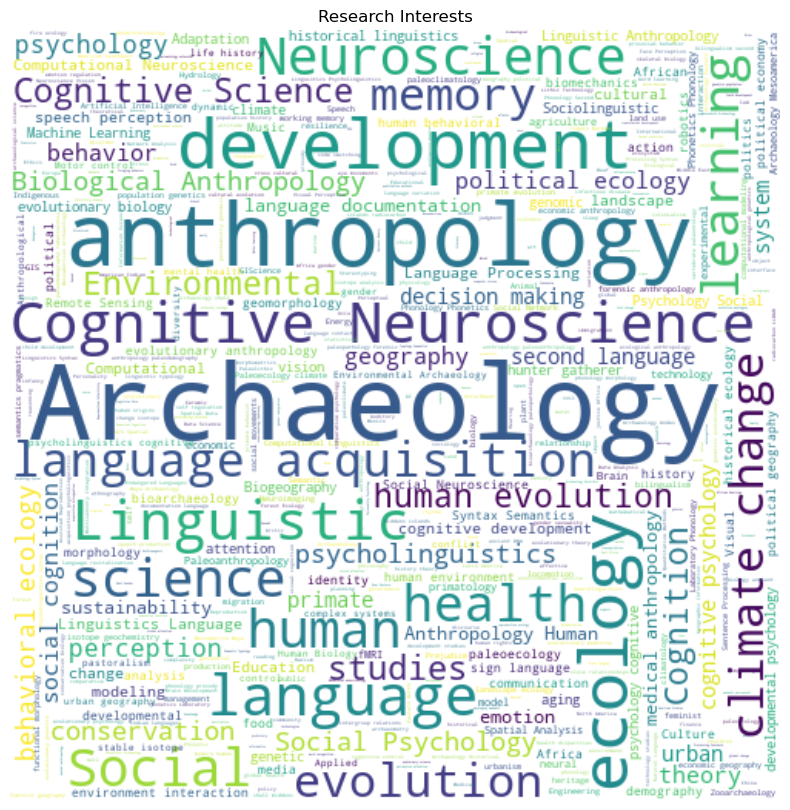

In [11]:
# create a Wordcloud object
text = ' '.join([' '.join(interest) for interest in author_df['interests'].dropna()])
wc = WordCloud(background_color="white", max_words=500, width=1000, height=1000, mode='RGBA', scale=.5).generate(text)

# display the generated word cloud:
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.title(f'Research Interests')
plt.show()

# Funding Overview

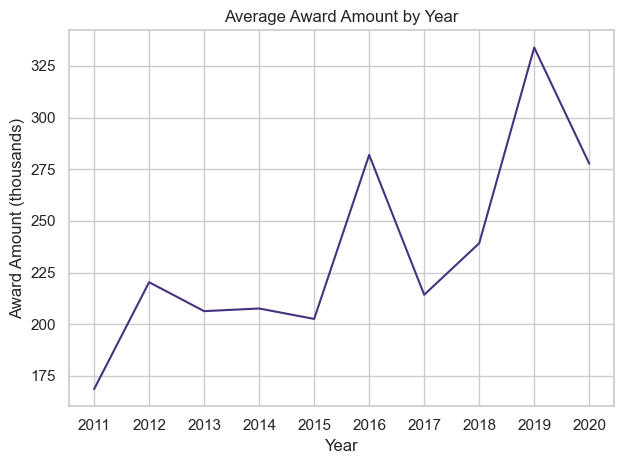

In [12]:
# First, plot a line chart showing average NSF funding amount per year
avg_funding_by_year = pd.DataFrame(np.round(combined_info.groupby(by=['award_year'])['award_amount'].mean() / 1000, 2))

sns.set_theme(style="whitegrid", palette="viridis")
sns.lineplot(data=avg_funding_by_year, x='award_year', y='award_amount')
plt.xticks(ticks=np.unique(combined_info['award_year']), labels=np.unique(combined_info['award_year']))
plt.title('Average Award Amount by Year')
plt.xlabel('Year')
plt.ylabel('Award Amount (thousands)')
plt.tight_layout()

#  Author Research Impact

# Research Trends and Interests

In [13]:
# There are rows where absract are not string (but instead float)
# Upon checking, they are NaN.
funding_info[funding_info['abstract'].apply(lambda x: not isinstance(x, str))]

,first_name,middle_name,last_name,email,institution,directorate,division,effective_date,expiration_date,award_amount,award_title,abstract,award_year
1854,Joshua,NaN,Fisher,Joshua.B.Fisher@jpl.nasa.gov,National Aeronautics and Space Administration,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,09/01/2014,02/28/2018,99114,Collaborative Research: Links Between Long-Ter...,NaN,2014
3991,Marc,M,Sebrechts,sebrechts@cua.edu,Catholic University of America,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,08/01/2018,08/19/2022,212550,IPA Agreement,NaN,2018
4570,Peter,M,Vishton,vishton@wm.edu,College of William and Mary,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,09/03/2019,09/02/2022,136965,IPA Award,NaN,2019
4579,Tyler,NaN,Kendall,tsk@uoregon.edu,University of Oregon Eugene,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,08/18/2019,08/18/2022,150470,New IPA Award,NaN,2019
4602,Siobhan,NaN,Mattison,siobhan.mattison@gmail.com,University of New Mexico,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,09/03/2019,09/02/2023,124135,New IPA Award - Siobhan Mattison,NaN,2019
4942,Trisha,NaN,Van Zandt,van-zandt.2@osu.edu,Ohio State University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,07/06/2020,07/05/2022,187691,IPA agreement for Dr. Trisha Van Zandt,NaN,2020


In [14]:
# Drop rows where abstract is NaN
funding_info = funding_info[funding_info['abstract'].notna()]

In [15]:
# Word cloud for funding abstract over the years
funding_info['tokenized_abstract'] = funding_info['abstract'].apply(lambda x: [lucem_illud.word_tokenize(s) for s in lucem_illud.sent_tokenize(x)])
funding_info['normalized_abstract'] = funding_info['tokenized_abstract'].apply(lambda x: [lucem_illud.normalizeTokens(s) for s in x])
funding_info.head()

/Users/samcong/anaconda3/lib/python3.11/site-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


,first_name,middle_name,last_name,email,institution,directorate,division,effective_date,expiration_date,award_amount,award_title,abstract,award_year,tokenized_abstract,normalized_abstract
0,Jean,NaN,Comaroff,jcomaro@uchicago.edu,University of Chicago,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,02/01/2011,01/31/2013,20000,Doctoral Dissertation Research: The Role of Kn...,University of Chicago doctoral student Brenden...,2011,"[[University, of, Chicago, doctoral, student, ...","[[university, chicago, doctoral, student, bren..."
1,Talal,NaN,Asad,talalasad@earthlink.net,CUNY Graduate School University Center,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,09/30/2012,19901,Doctoral Dissertation Research: Mental Disorde...,Doctoral student Ana Maria Vinea (Graduate Cen...,2011,"[[Doctoral, student, Ana, Maria, Vinea, Gradua...","[[doctoral, student, ana, maria, vinea, gradua..."
2,John,NaN,Cherry,John_Cherry@brown.edu,Brown University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,06/30/2012,14820,Doctoral Dissertation Improvement Grant: Rethi...,In collaboration with the Central Lydia Archae...,2011,"[[In, collaboration, with, the, Central, Lydia...","[[collaboration, central, lydia, archaeologica..."
3,Leaf,NaN,Van Boven,vanboven@colorado.edu,University of Colorado at Boulder,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,03/31/2015,250000,EAGER: Perceiving Political Distributions,The present research focuses on motivated poli...,2011,"[[The, present, research, focuses, on, motivat...","[[present, research, focuses, motivated, polit..."
4,Steven,NaN,Bedrick,bedricks@ohsu.edu,Oregon Health & Science University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,09/30/2013,114140,"Corpora of Non-Linguistic Symbol Systems, and ...","Throughout the millenia, humans have used grap...",2011,"[[Throughout, the, millenia, humans, have, use...","[[millenia, humans, graphical, symbols], [year..."


In [16]:
funding_info['wordcloud_text'] = funding_info['normalized_abstract'].apply(lambda x: [item for sublist in x for item in sublist])
funding_info.head()

,first_name,middle_name,last_name,email,institution,directorate,division,effective_date,expiration_date,award_amount,award_title,abstract,award_year,tokenized_abstract,normalized_abstract,wordcloud_text
0,Jean,NaN,Comaroff,jcomaro@uchicago.edu,University of Chicago,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,02/01/2011,01/31/2013,20000,Doctoral Dissertation Research: The Role of Kn...,University of Chicago doctoral student Brenden...,2011,"[[University, of, Chicago, doctoral, student, ...","[[university, chicago, doctoral, student, bren...","[university, chicago, doctoral, student, brend..."
1,Talal,NaN,Asad,talalasad@earthlink.net,CUNY Graduate School University Center,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,09/30/2012,19901,Doctoral Dissertation Research: Mental Disorde...,Doctoral student Ana Maria Vinea (Graduate Cen...,2011,"[[Doctoral, student, Ana, Maria, Vinea, Gradua...","[[doctoral, student, ana, maria, vinea, gradua...","[doctoral, student, ana, maria, vinea, graduat..."
2,John,NaN,Cherry,John_Cherry@brown.edu,Brown University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,01/01/2011,06/30/2012,14820,Doctoral Dissertation Improvement Grant: Rethi...,In collaboration with the Central Lydia Archae...,2011,"[[In, collaboration, with, the, Central, Lydia...","[[collaboration, central, lydia, archaeologica...","[collaboration, central, lydia, archaeological..."
3,Leaf,NaN,Van Boven,vanboven@colorado.edu,University of Colorado at Boulder,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,03/31/2015,250000,EAGER: Perceiving Political Distributions,The present research focuses on motivated poli...,2011,"[[The, present, research, focuses, on, motivat...","[[present, research, focuses, motivated, polit...","[present, research, focuses, motivated, politi..."
4,Steven,NaN,Bedrick,bedricks@ohsu.edu,Oregon Health & Science University,"Direct For Social, Behav & Economic Scie",Division Of Behavioral and Cognitive Sci,04/01/2011,09/30/2013,114140,"Corpora of Non-Linguistic Symbol Systems, and ...","Throughout the millenia, humans have used grap...",2011,"[[Throughout, the, millenia, humans, have, use...","[[millenia, humans, graphical, symbols], [year...","[millenia, humans, graphical, symbols, years, ..."


In [17]:
# Define a function to remove html components in the string
def remove_html(content_list):
    # Convert HTML entities to their corresponding characters
    cleaned_content_list = []

    for i in content_list:
        decoded_content = html.unescape(i)
    
        # Remove HTML tags
        clean_content = re.sub(r'<[^>]*>', '', decoded_content)

        cleaned_content_list.append(clean_content)

    
    return cleaned_content_list

In [18]:
funding_info['wordcloud_text_cleaned'] = funding_info['wordcloud_text'].apply(remove_html)

In [19]:
# Group the normalized abstract tokens by award year
funding_info_aggregated_words = funding_info.groupby('award_year')['wordcloud_text_cleaned'].agg(lambda x: sum(x, [])).reset_index()
funding_info_aggregated_words['wordcloud_text_cleaned'] = funding_info_aggregated_words['wordcloud_text_cleaned'].apply(lambda x: ' '.join(x))
funding_info_aggregated_words

,award_year,wordcloud_text_cleaned
0,2011,university chicago doctoral student brenden ra...
1,2012,primary goal project extend current signtyp da...
2,2013,funding national science foundation dr glenn s...
3,2014,wars afghanistan iraq characterized exceptiona...
4,2015,sarah hlubik rutgers state university new jers...
5,2016,essential elements constitute minimal scientif...
6,2017,past decades cutting edge social personality p...
7,2018,award nsf eager funding mechanism supports ear...
8,2019,project combine genomic historical archaeologi...
9,2020,financial activities ubiquitous worldwide glob...


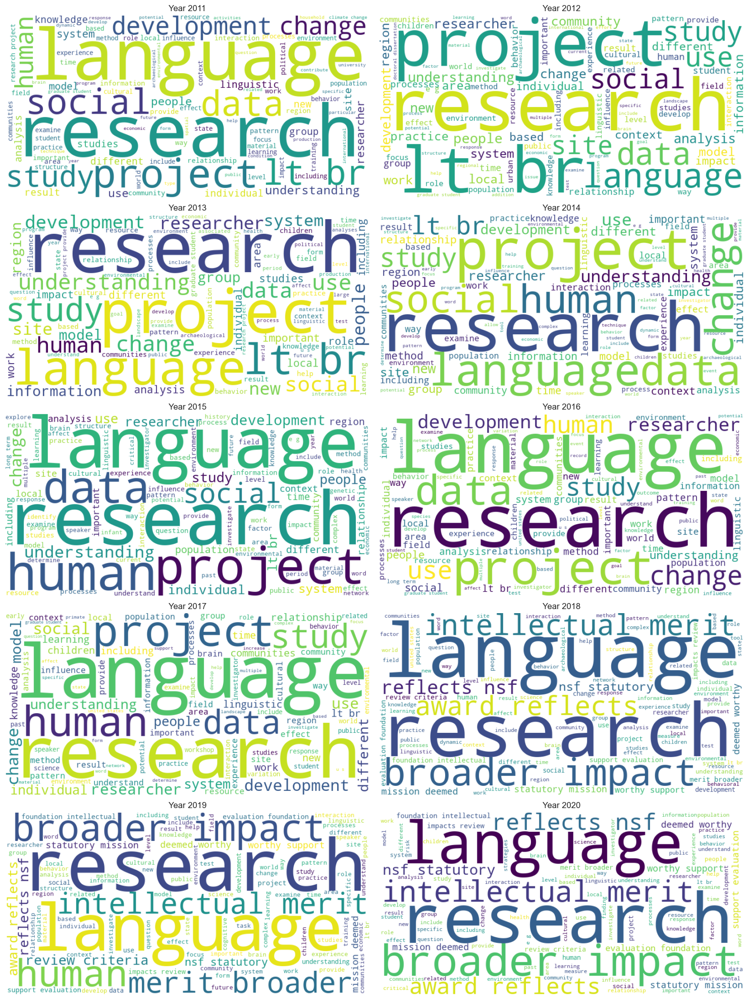

In [20]:
# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=2,  figsize=(15, 20))
axes = axes.flatten()

for i, row in funding_info_aggregated_words.iterrows():
    # Generate a word cloud image for each year
    wordcloud = WordCloud(background_color='white', max_words=100, width=800, height=400).generate(row['wordcloud_text_cleaned'])
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f"Year {row['award_year']}")
    plt.tight_layout()

# Funding vs. Research Impact

In [21]:
# Add a column indicating whether the specific publication is before or after NSF award
# Here, we take publication year which is the same as award year as "before_award"
regression_data["before_after_award"] = np.where(regression_data["year"] <= regression_data["award_year"], "before_award", "after_award")

In [22]:
group_by_citation = regression_data.groupby(by=['before_after_award', 'email'])['citation'].mean().reset_index()

# find thresholds
Q1 = group_by_citation['citation'].quantile(0.25)
Q3 = group_by_citation['citation'].quantile(0.75)
IQR = Q3 - Q1

# remvoe outliers
group_by_citation = group_by_citation.query('(@Q1 - 1.5 * @IQR) <= citation <= (@Q3 + 1.5 * @IQR)')
group_by_citation

,before_after_award,email,citation
0,after_award,00t0holtgrav@bsu.edu,543.250000
1,after_award,Alvard@tamu.edu,587.428571
3,after_award,Amy.Syvertsen@gmail.com,373.250000
4,after_award,Ariel.Goldberg@tufts.edu,66.250000
5,after_award,Ashley.VanMeter@georgetown.edu,523.000000
...,...,...,...
4051,before_award,zhonglin@nyu.edu,1017.800000
4052,before_award,zkrizan@iastate.edu,126.600000
4053,before_award,zoe.wool@rice.edu,22.750000
4054,before_award,zook@uky.edu,300.500000


In [23]:
# Calculate median values of average yearly citation
median_yearly_citation = group_by_citation.groupby(by=['before_after_award'])['citation'].median()

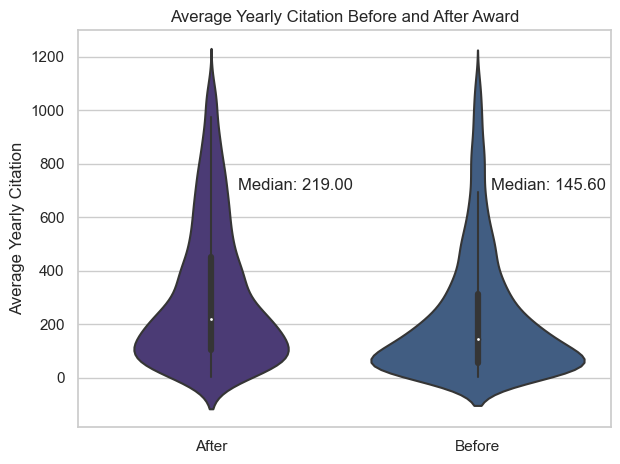

In [24]:
sns.despine(offset=10, trim=True)
sns.violinplot(data=group_by_citation, x='before_after_award', y='citation')
plt.title('Average Yearly Citation Before and After Award')

plt.text(x=0.1, y=700, s=f"Median: {median_yearly_citation[0]:.2f}")
plt.text(x=1.05, y=700, s=f"Median: {median_yearly_citation[1]:.2f}")

plt.xlabel('')
plt.ylabel('Average Yearly Citation')

plt.xticks([0, 1], ['After', 'Before'])
plt.tight_layout()
plt.show()

# Visualization Related to Clustering of Authors Based on Paper Abstract 

In [25]:
# Load `tfidf_matrix_2D`, and `kmeans_tfidf` for later descriptive and visualization
with open('../database/author_clustering/tfidf_matrix_2D.pkl', 'rb') as file:
    tfidf_matrix_2D = pickle.load(file)

with open('../database/author_clustering/tfidf_cluster_mapping.pkl', 'rb') as file:
    tfidf_cluster_mapping = pickle.load(file)

with open('../database/author_clustering/kmeans_tfidf.pkl', 'rb') as file:
    kmeans_tfidf = pickle.load(file)

In [26]:
# cluster assignments
y_kmeans_tfidf = kmeans_tfidf.predict(tfidf_matrix_2D)

# calculate the size for each cluster
sizes = [np.sum(y_kmeans_tfidf == i) for i in range(kmeans_tfidf.n_clusters)]

## Visualize K-Means Clustering

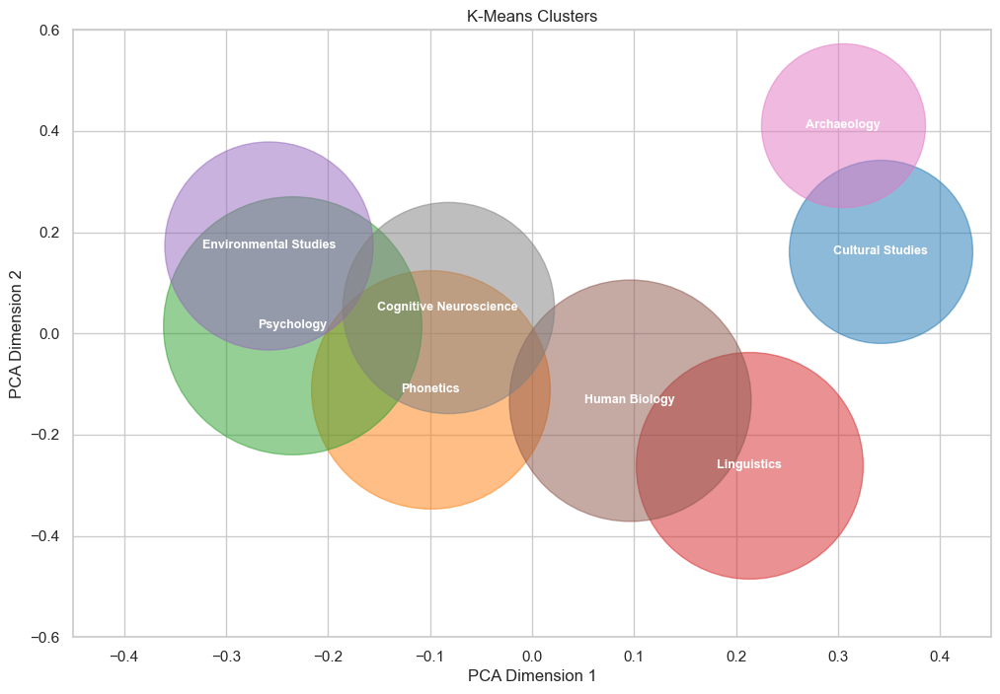

In [27]:
plt.figure(figsize=(12, 8))

# define a colormap
colors = plt.cm.tab10.colors

# plot each cluster with a different color and size
for i in range(kmeans_tfidf.n_clusters):
    centroid = kmeans_tfidf.cluster_centers_[i]
    size = sizes[i] * 100 
    plt.scatter(centroid[0], centroid[1], s=size, label=f'Cluster {i}', alpha=0.5, color=colors[i % len(colors)])
    plt.text(centroid[0], centroid[1], tfidf_cluster_mapping[i], ha='center', va='center', color='white', fontsize=9, weight='bold')

plt.xlim(-0.45, 0.45)
plt.ylim(-0.6, 0.6)

plt.title('K-Means Clusters')
plt.xlabel('PCA Dimension 1')
plt.ylabel('PCA Dimension 2')
plt.show()

## Visualize Word Cloud for Each Cluster

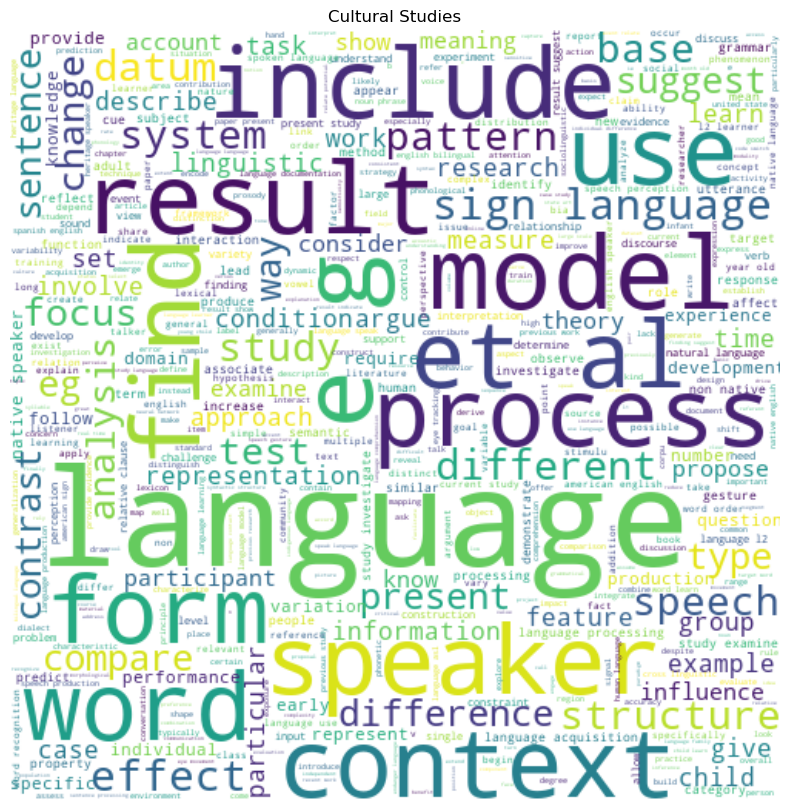

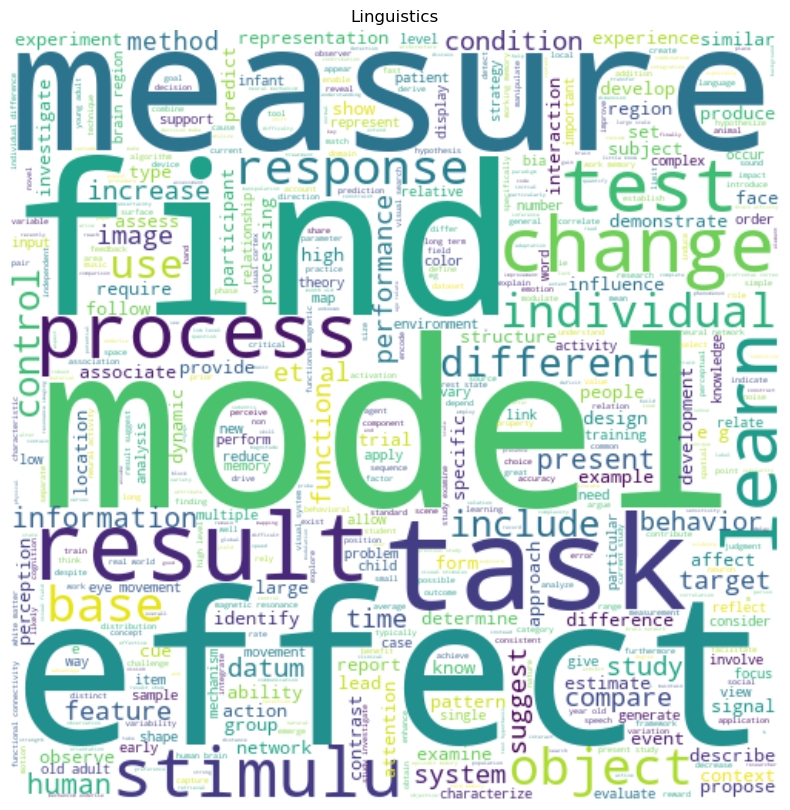

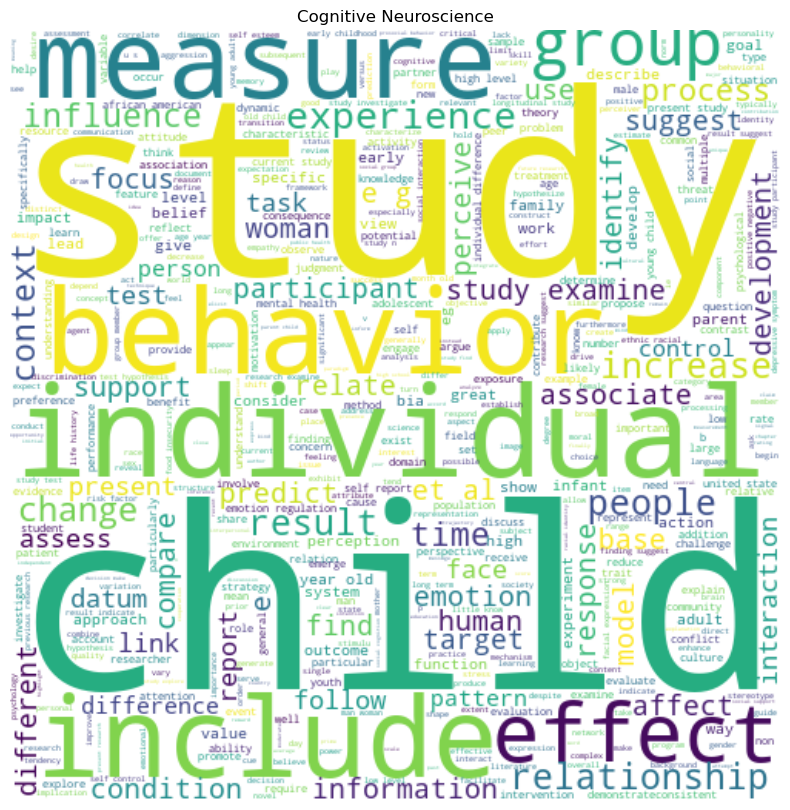

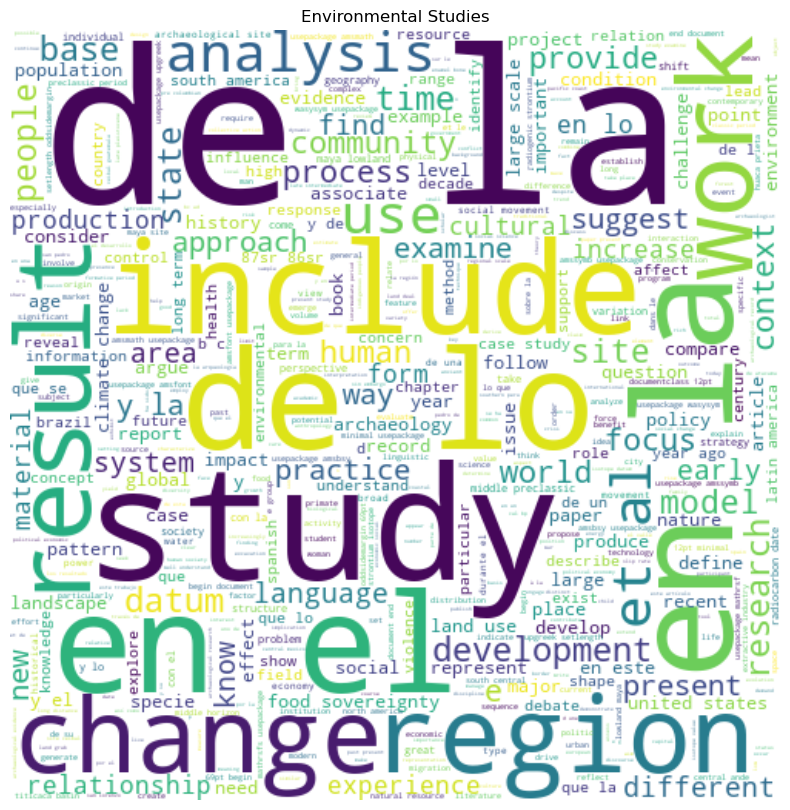

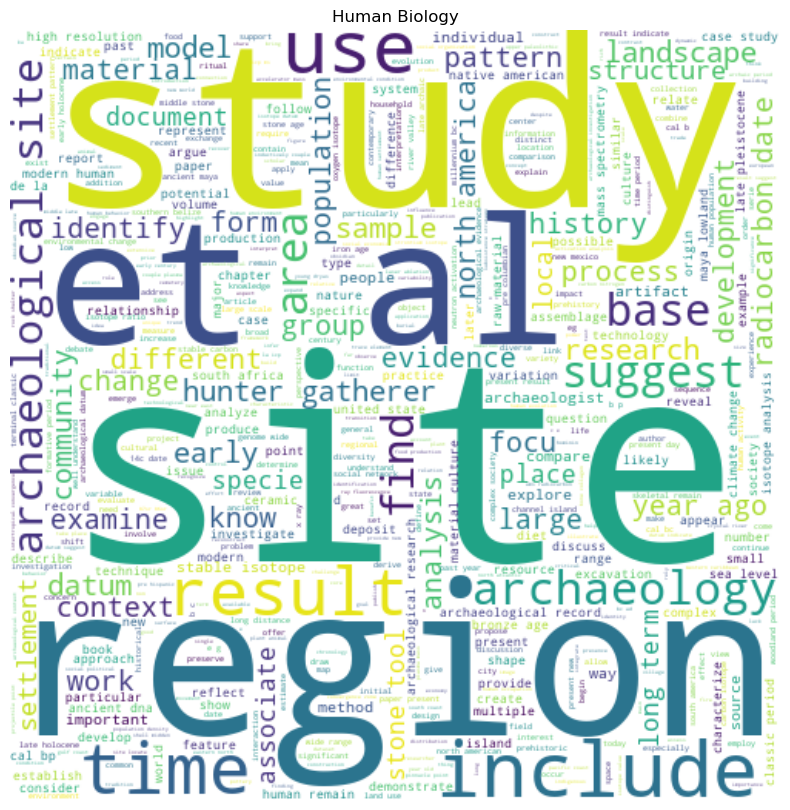

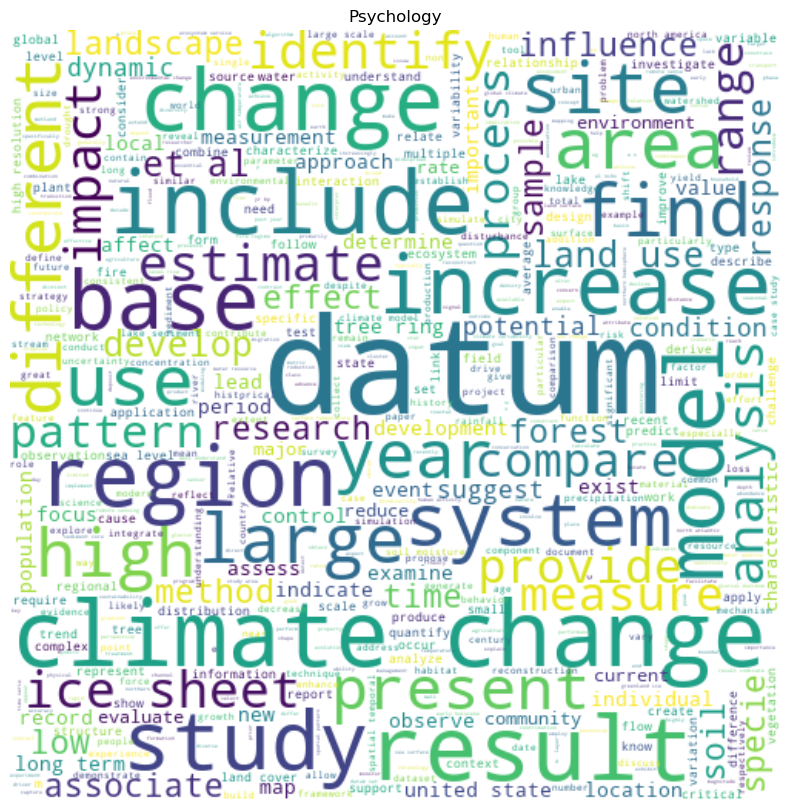

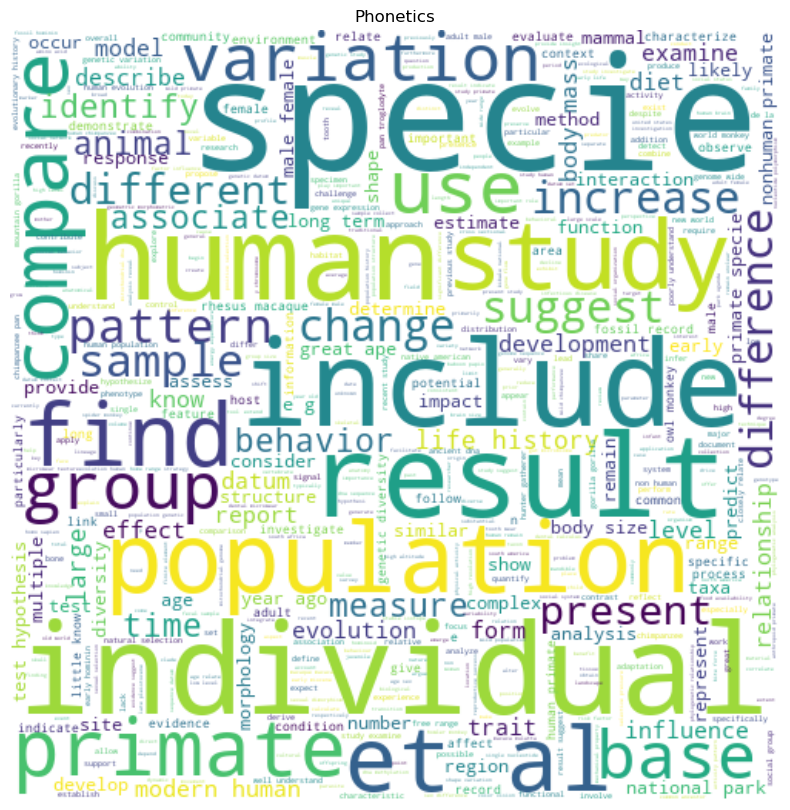

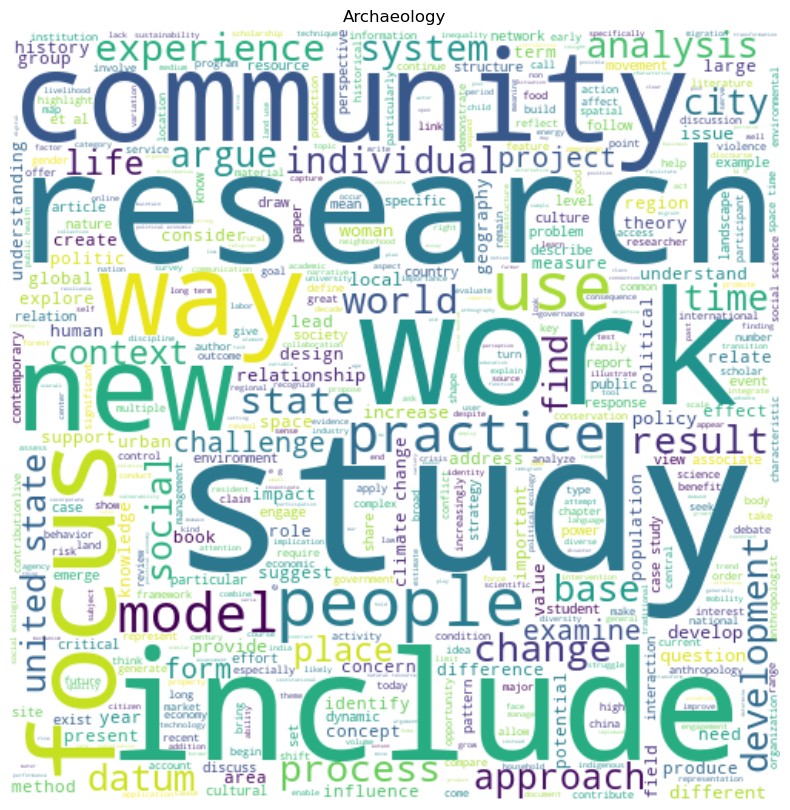

In [28]:
# find all labels
labels = cluster_df['tfidf_cluster'].unique()

# reset sns
sns.reset_orig()

# generate a word cloud for each cluster
for label in labels:
    subset = cluster_df[cluster_df['tfidf_cluster'] == label]
    text = subset['normalized_abstract'].sum()

    # create a WordCloud object
    wc = WordCloud(background_color="white", max_words=500, width=1000, height=1000, mode='RGBA', scale=.5).generate(text)
    
    # display the word cloud
    plt.figure(figsize=(10, 10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'{label}')
    plt.show()

In [29]:
# create a dataframe for 'journal' visualization 
journal_df = combined_info.groupby('email')['journal'].apply(list).reset_index()
journal_df = pd.merge(cluster_df, journal_df, on='email', how='left')
journal_df

,email,normalized_abstract,tfidf_cluster,journal
0,00t0holtgrav@bsu.edu,interdisciplinary synthesis social psychologic...,Cultural Studies,"[journal not found, Journal of gambling studie..."
1,a.satpute@northeastern.edu,emotion assume manifest subcortical limbic bra...,Linguistics,"[journal not found, journal not found, journal..."
2,aabrewer@uci.edu,functional organization human auditory cortex ...,Linguistics,"[journal not found, Frontiers in psychology, A..."
3,aag6@psu.edu,decade introduction concept emotional labor re...,Cognitive Neuroscience,"[journal not found, Journal of occupational he..."
4,aam72@georgetown.edu,autism spectrum disorder asds characterize soc...,Cognitive Neuroscience,"[Development and Psychopathology, JAMA Psychia..."
...,...,...,...,...
2029,zkrizan@iastate.edu,narcissism spectrum model synthesize extensive...,Cognitive Neuroscience,"[journal not found, Perspectives on Psychologi..."
2030,zoe.wool@rice.edu,war zoë h. wool explore american soldier sever...,Archaeology,"[journal not found, Critical Military Studies,..."
2031,zook@uky.edu,paper outline way information technologie hait...,Archaeology,"[World Medical & Health Policy, Cambridge jour..."
2032,zulu@msu.edu,urban household sub saharan africa use charcoa...,Psychology,"[journal not found, journal not found, BMC inf..."


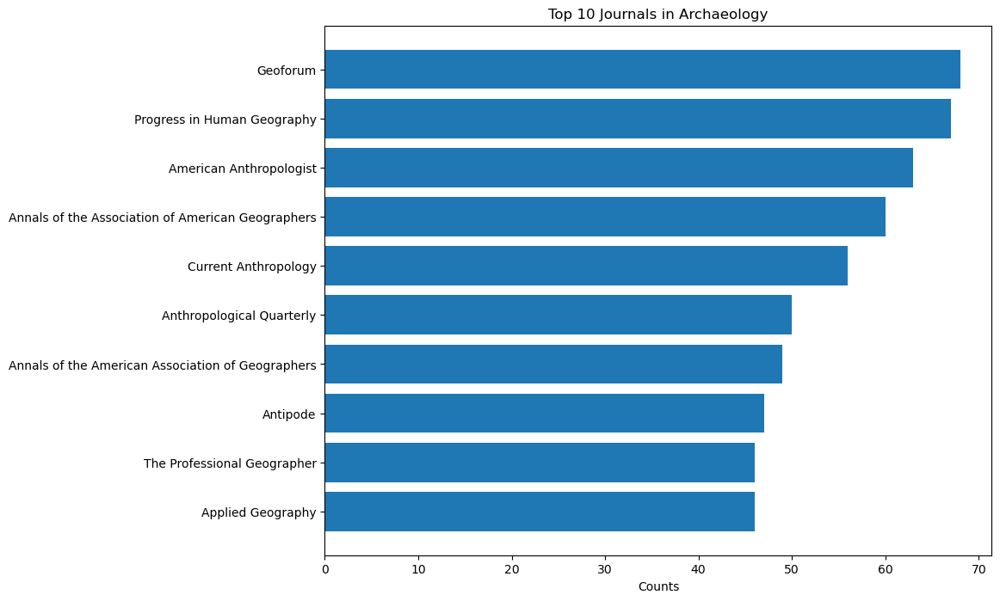

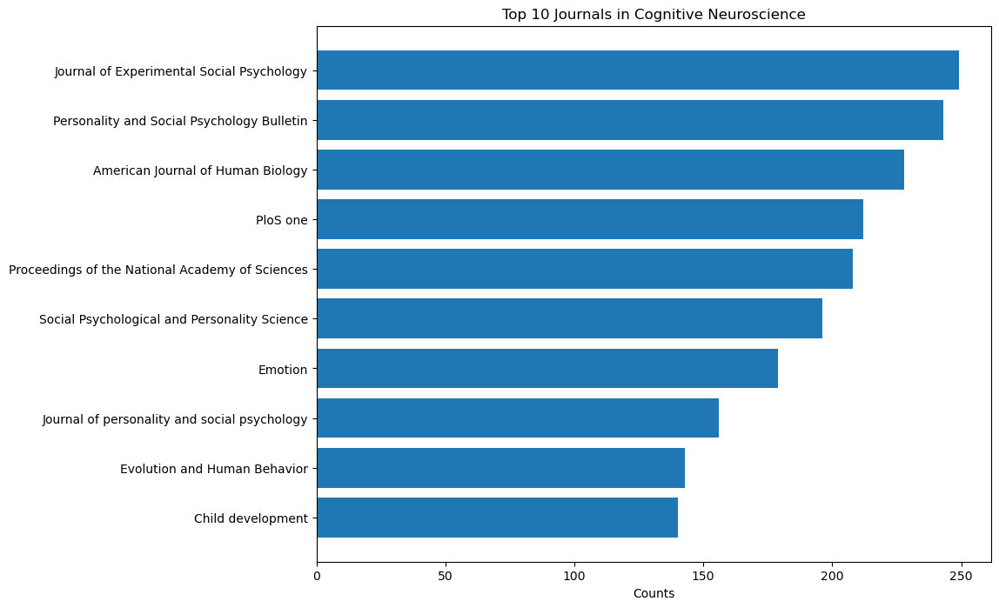

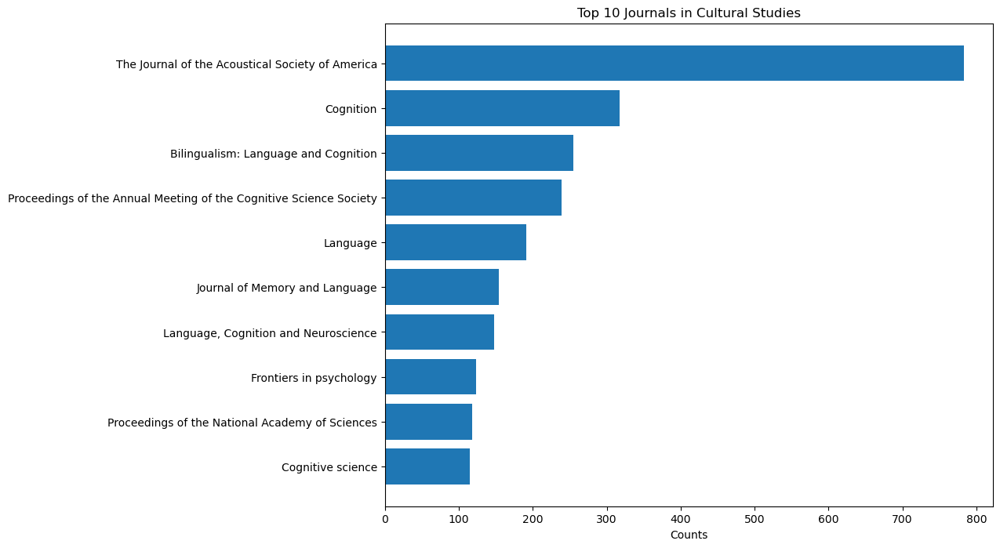

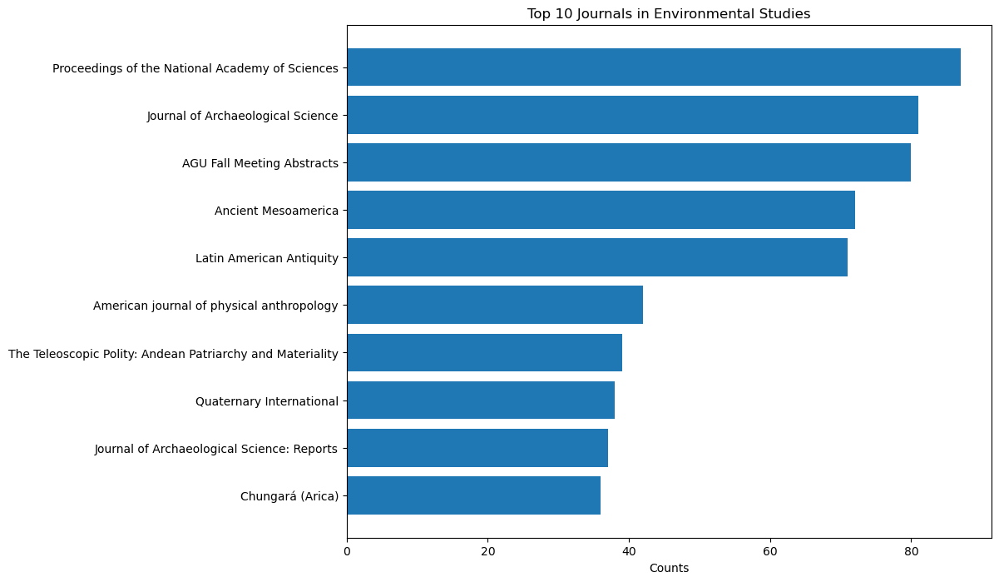

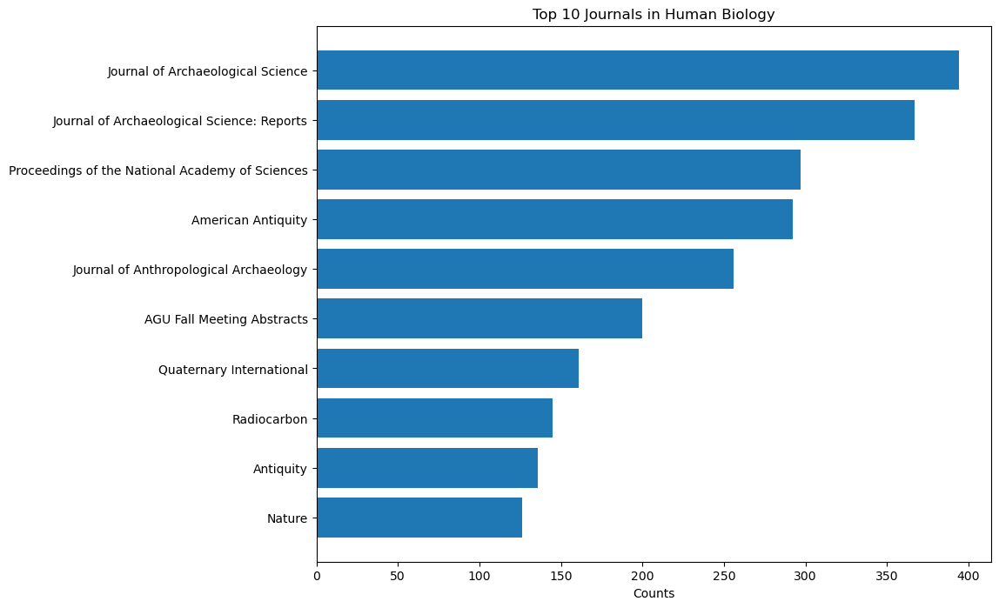

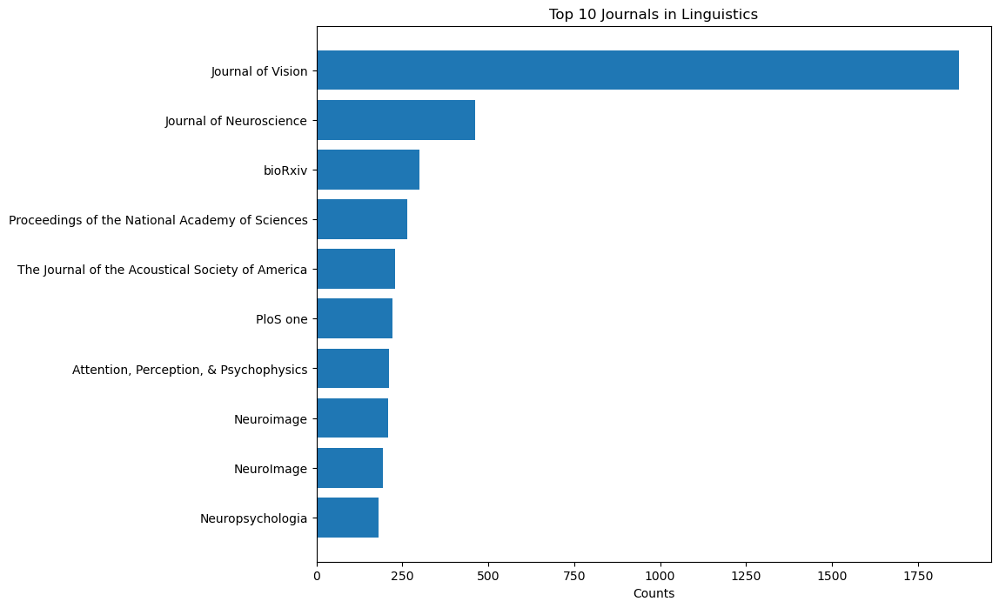

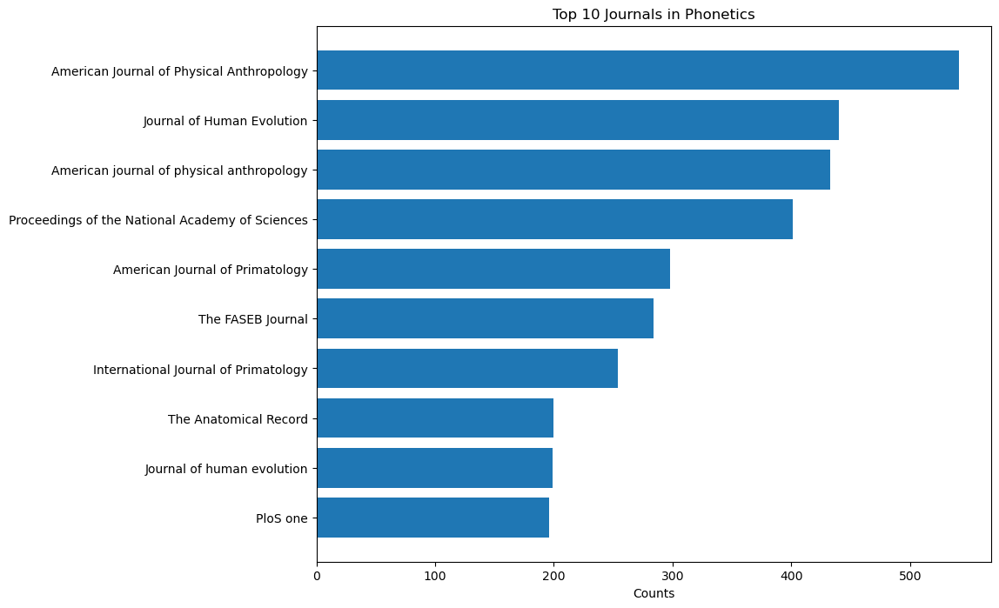

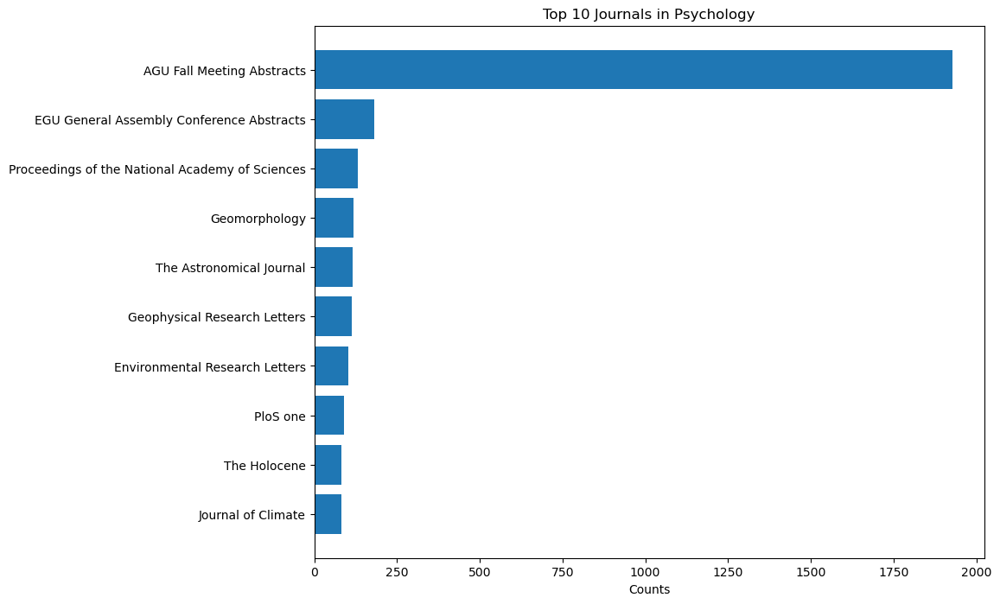

In [30]:
# flatten lists in 'journal' column
expanded_rows = journal_df.explode('journal')

# remove 'journal not found' entries
cleaned_rows = expanded_rows[expanded_rows['journal'] != 'journal not found']

# count the occurrences of each journal within each cluster
journal_counts = cleaned_rows.groupby(['tfidf_cluster', 'journal']).size().reset_index(name='counts')

# identify the top 10 journals for each cluster
top_journals = journal_counts.groupby('tfidf_cluster').apply(lambda x: x.nlargest(10, 'counts')).reset_index(drop=True)

# plot the bar graphs for each cluster
clusters = top_journals['tfidf_cluster'].unique()
for cluster in clusters:
    plt.figure(figsize=(10, 8))
    cluster_data = top_journals[top_journals['tfidf_cluster'] == cluster]
    cluster_data = cluster_data.sort_values('counts', ascending=True)
    plt.barh(cluster_data['journal'], cluster_data['counts'])
    plt.xlabel('Counts')
    plt.title(f'Top 10 Journals in {cluster}')
    plt.show()

In [31]:
# create a dataframe for 'award_amount' visualization
award_df = combined_info.groupby('email')['award_amount'].sum().reset_index()
award_df = pd.merge(cluster_df, award_df, on='email', how='left')
award_df

,email,normalized_abstract,tfidf_cluster,award_amount
0,00t0holtgrav@bsu.edu,interdisciplinary synthesis social psychologic...,Cultural Studies,10130760
1,a.satpute@northeastern.edu,emotion assume manifest subcortical limbic bra...,Linguistics,27999930
2,aabrewer@uci.edu,functional organization human auditory cortex ...,Linguistics,11898950
3,aag6@psu.edu,decade introduction concept emotional labor re...,Cognitive Neuroscience,1150128
4,aam72@georgetown.edu,autism spectrum disorder asds characterize soc...,Cognitive Neuroscience,15220647
...,...,...,...,...
2029,zkrizan@iastate.edu,narcissism spectrum model synthesize extensive...,Cognitive Neuroscience,12308114
2030,zoe.wool@rice.edu,war zoë h. wool explore american soldier sever...,Archaeology,7999872
2031,zook@uky.edu,paper outline way information technologie hait...,Archaeology,12794103
2032,zulu@msu.edu,urban household sub saharan africa use charcoa...,Psychology,415714


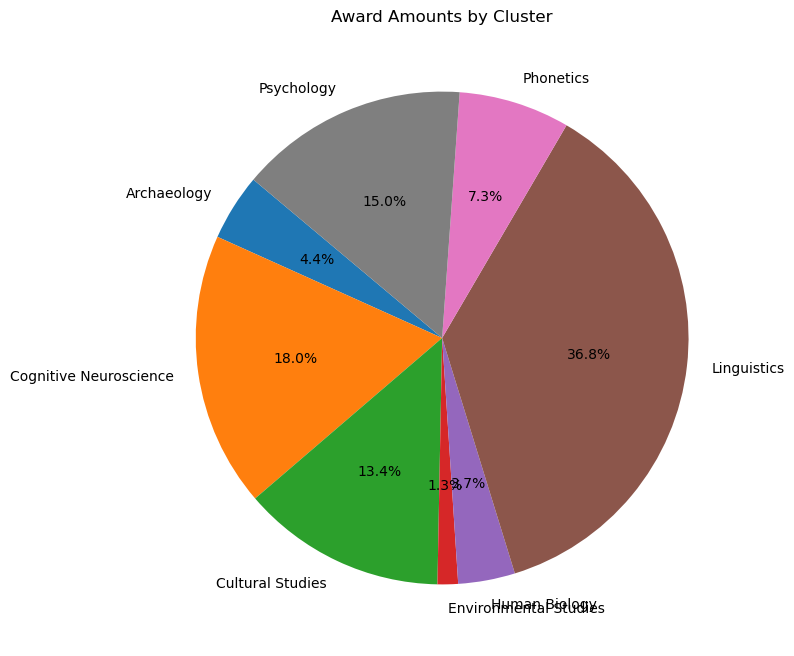

In [32]:
# group 'award_amount' by cluster
award_sums = award_df.groupby('tfidf_cluster')['award_amount'].sum()

# plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(award_sums, labels=award_sums.index, autopct='%1.1f%%', startangle=140)
plt.title('Award Amounts by Cluster')
plt.show()

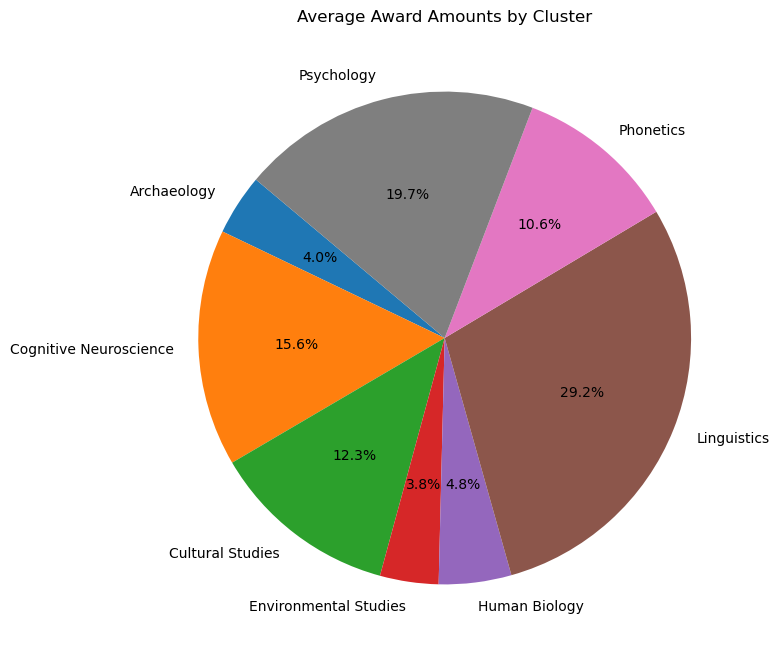

In [33]:
# calculate the average 'award_amount' for each cluster
award_averages = award_df.groupby('tfidf_cluster')['award_amount'].mean()

# plot the pie chart for the average amounts
plt.figure(figsize=(8, 8))
plt.pie(award_averages, labels=award_averages.index, autopct='%1.1f%%', startangle=140)
plt.title('Average Award Amounts by Cluster')
plt.show()